In [56]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from skopt.plots import plot_objective, plot_histogram

from sklearn.datasets import load_digits
from sklearn.svm import LinearSVC, SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import ParameterGrid
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
import matplotlib.pylab as plt
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import brier_score_loss
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, loguniform
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay
import seaborn as sns

In [2]:
df=pd.read_csv('Base_campaña_DC.csv',encoding='iso-8859-1',sep=';')
df[' Patrimonio '] = df[' Patrimonio '].astype('str').str[:-3].astype('float')
df[' Ingresos_Mensuales '] = df[' Ingresos_Mensuales '].astype('str').str[:-3].astype('float')
df['oficina'] = df['oficina'].astype('str')
df['fecha_ult_desembolso'] = pd.to_datetime(df['fecha_ult_desembolso'],format='%d/%m/%Y')
df['tasa'] = df['tasa'].astype(str).str.replace(',','.').astype('float')
df['Acepta_Campaña']=df['Acepta_Campaña'].astype('category')
df['monto_credito']=df['monto_credito'].astype(float)
df['saldo_capital']=df['saldo_capital'].astype(float)
df['saldo_Ahorro']=df['saldo_Ahorro'].astype(float)

df.columns=[i.strip() for  i in df.columns]
y = df.columns[-1]
x=['Ciudad','Patrimonio','Ingresos_Mensuales',
 'No_hijos','oficina','monto_credito','tasa','saldo_capital',
 'saldo_Ahorro','Antiguedad_en_meses','Max_dias_mora','plazo_dias','Edad']
X = df[x]

cat_cols = X.select_dtypes(include=['object', 'category','bool']).columns.to_list()
numeric_cols = X.select_dtypes(include=['float64']).columns.to_list()
df["Acepta_Campaña"] = df["Acepta_Campaña"].cat.codes
Y = df[y]


X= pd.get_dummies(X,  columns = cat_cols)
scaler = StandardScaler()
X[numeric_cols]=scaler.fit_transform(X[numeric_cols])
print(X.shape)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, stratify=Y, random_state = 1)
print(y_train.value_counts())
print(Y.value_counts())

(2628, 44)
0    925
1    914
Name: Acepta_Campaña, dtype: int64
0    1322
1    1306
Name: Acepta_Campaña, dtype: int64


# Exploratory analysis

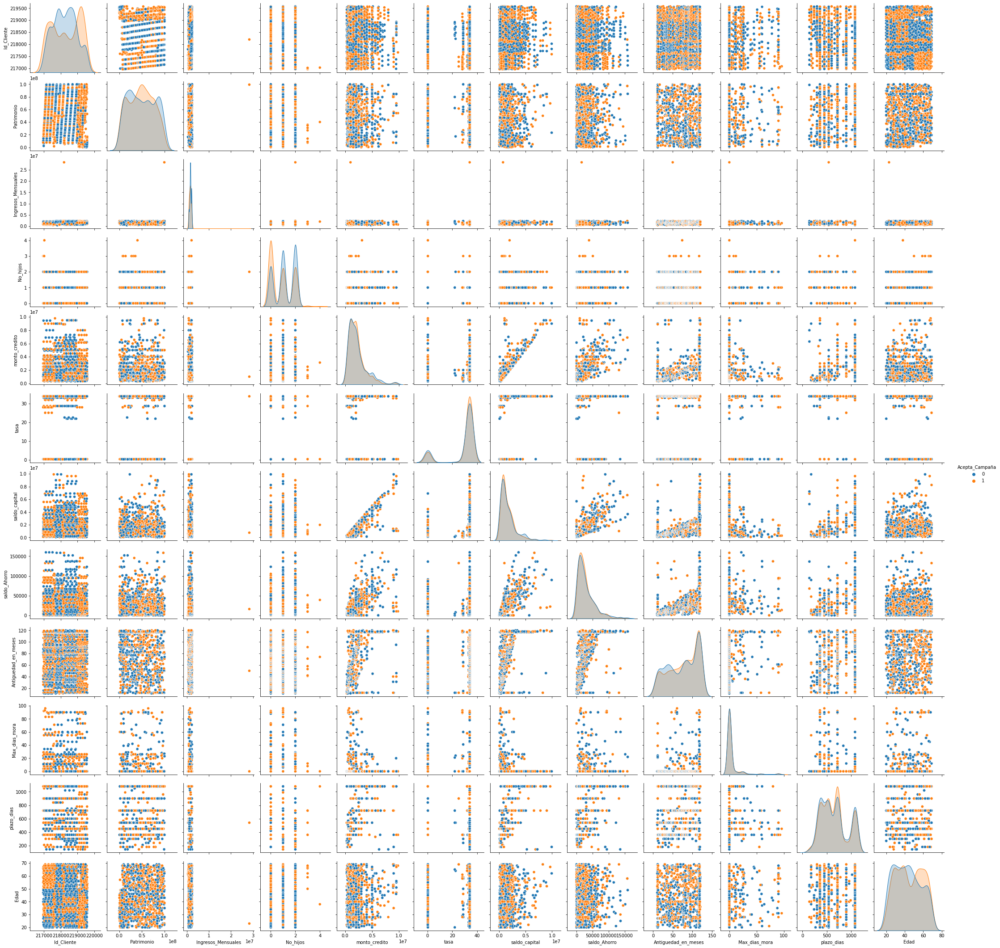

In [57]:
sns.pairplot(df,hue='Acepta_Campaña')

In [58]:
from pandas_profiling import ProfileReport

/Users/jamontanac/anaconda3/envs/proyecto/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [59]:
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)

In [69]:
profile.to_file("Reporte.html")

Export report to file: 100%|██████████████████████| 1/1 [00:00<00:00,  5.93it/s]


In [70]:
import IPython
IPython.display.HTML(filename='Reporte.html')

Number of variables,16
Number of observations,2628
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,612.1 KiB
Average record size in memory,238.5 B
Numeric,12
Categorical,3
DateTime,1


Hay correlaciones, toca tenerlo en cuenta para modelos de tipo lineal

# Random Forest

In [3]:
param_grid = ParameterGrid(
                {'n_estimators': [90,130,150],
                 'class_weight' : ['balanced'],
                 'max_features': ['auto', 'sqrt'],
                 'max_depth'   : [17,19, 21, 31,None],
                 'criterion'   : ['gini', 'entropy']
                }
            )
# Loop para ajustar un modelo con cada combinación de hiperparámetros
# ==============================================================================
resultados = {'params': [], 'oob_accuracy': []}

for params in param_grid:
    
    modelo = RandomForestClassifier(
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123,
                ** params
             )
    
    modelo.fit(X_train, y_train)
    
    resultados['params'].append(params)
    resultados['oob_accuracy'].append(modelo.oob_score_)
    print(f"Modelo: {params} \u2713")

Modelo: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 17, 'max_features': 'auto', 'n_estimators': 90} ✓
Modelo: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 17, 'max_features': 'auto', 'n_estimators': 130} ✓
Modelo: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 17, 'max_features': 'auto', 'n_estimators': 150} ✓
Modelo: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 17, 'max_features': 'sqrt', 'n_estimators': 90} ✓
Modelo: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 17, 'max_features': 'sqrt', 'n_estimators': 130} ✓
Modelo: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 17, 'max_features': 'sqrt', 'n_estimators': 150} ✓
Modelo: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 19, 'max_features': 'auto', 'n_estimators': 90} ✓
Modelo: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 19, 'max_features': 'auto', 'n_estimators': 130} ✓
Modelo: {'class_weight': 'b

In [4]:
modelo.score(X,Y)

0.9318873668188736

In [5]:
# Resultados
# ==============================================================================
resultados = pd.DataFrame(resultados)
resultados = pd.concat([resultados, resultados['params'].apply(pd.Series)], axis=1)
resultados = resultados.sort_values('oob_accuracy', ascending=False)
resultados = resultados.drop(columns = 'params')
resultados.head(4)

,oob_accuracy,class_weight,criterion,max_depth,max_features,n_estimators
23,0.844481,balanced,gini,31.0,sqrt,150
20,0.844481,balanced,gini,31.0,auto,150
37,0.843937,balanced,entropy,19.0,auto,130
40,0.843937,balanced,entropy,19.0,sqrt,130


In [6]:
# Mejores hiperparámetros por out-of-bag error
# ==============================================================================
print("--------------------------------------------------")
print("Mejores hiperparámetros encontrados (oob-accuracy)")
print("--------------------------------------------------")
print(resultados.iloc[0,:]['oob_accuracy'], "accuracy")

--------------------------------------------------
Mejores hiperparámetros encontrados (oob-accuracy)
--------------------------------------------------
0.8444806960304513 accuracy


In [8]:
mejor_modelo = RandomForestClassifier(
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123,
                n_estimators = 150,
                class_weight = 'balanced',
                max_features = 'sqrt',
                max_depth = 31,
                criterion = 'gini'
                
             )
    
mejor_modelo.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=31,
                       max_features='sqrt', n_estimators=150, n_jobs=-1,
                       oob_score=True, random_state=123)

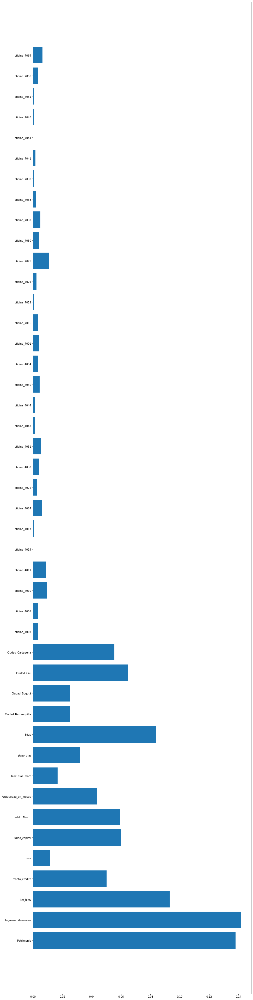

In [9]:
mejor_modelo.feature_importances_
plt.figure(figsize=(15,70))
plt.barh(X.columns, mejor_modelo.feature_importances_)
plt.show()

In [9]:
X.columns[mejor_modelo.feature_importances_>0.02]

Index(['Patrimonio', 'Ingresos_Mensuales', 'No_hijos', 'monto_credito',
       'saldo_capital', 'saldo_Ahorro', 'Antiguedad_en_meses', 'plazo_dias',
       'Edad', 'Ciudad_Barranquilla', 'Ciudad_Bogotá', 'Ciudad_Cali',
       'Ciudad_Cartagena'],
      dtype='object')

In [10]:
pred = mejor_modelo.predict(X = X_test)
#Matriz de confusión
#===================================================================================

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = pred
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = pred,
            normalize = True
           )

print("Matriz de confusión")
print("-------------------")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

Matriz de confusión
-------------------
[[344  53]
 [ 56 336]]

El accuracy de test es: 86.1850443599493 %


In [11]:
print(classification_report(
        y_true = y_test,
        y_pred = pred
    ))

              precision    recall  f1-score   support

           0       0.86      0.87      0.86       397
           1       0.86      0.86      0.86       392

    accuracy                           0.86       789
   macro avg       0.86      0.86      0.86       789
weighted avg       0.86      0.86      0.86       789



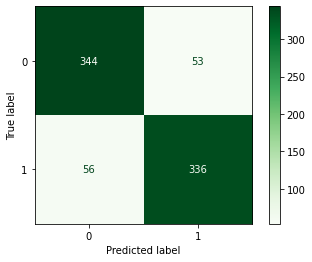

In [12]:
cm_display = ConfusionMatrixDisplay(mat_confusion).plot(cmap='Greens')

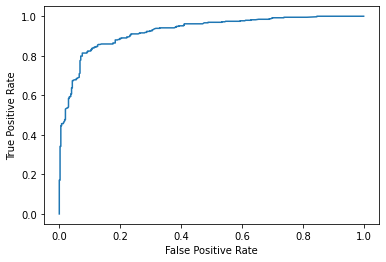

In [18]:
y_score = mejor_modelo.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=mejor_modelo.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

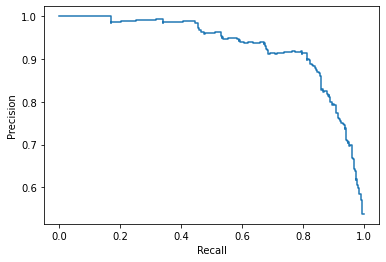

In [20]:
prec, recall, _ = precision_recall_curve(y_test, y_score, pos_label=mejor_modelo.classes_[1])
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot()

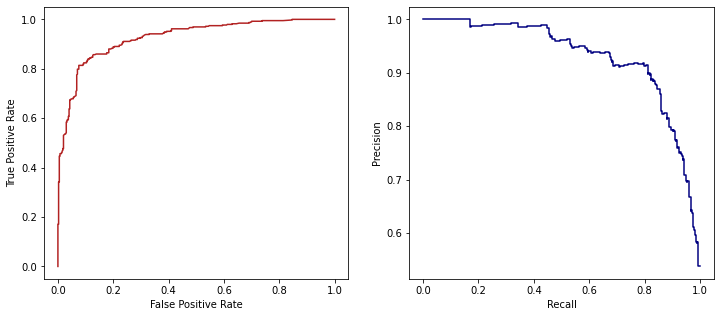

In [21]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

roc_display.plot(ax=ax1,color="firebrick")
pr_display.plot(ax=ax2,color="navy")
plt.show()

In [22]:
len(list(param_grid))

60

# SGD Classifier

In [23]:
param_grid = ParameterGrid(
                {'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron','modified_huber' ],
                 'penalty' : ['l1','l2','elasticnet']
                }
            )
# Loop para ajustar un modelo con cada combinación de hiperparámetros
# ==============================================================================
resultados = {'params': [], 'accuracy_train': [], 'accuracy_test': []}

for params in param_grid:
    
    modelo = SGDClassifier(
                early_stopping = True,
                validation_fraction=0.1,
                n_jobs       = -1,
                random_state = 123,
                tol=1e-5,
                ** params
             )
    
    modelo.fit(X_train, y_train)
    train_accu = modelo.score(X_train,y_train)
    test_accu = modelo.score(X_test,y_test)
    resultados['params'].append(params)
    resultados['accuracy_train'].append(train_accu)
    resultados['accuracy_test'].append(test_accu)
    print(f"Modelo: {params} \u2713 Accu_train: {train_accu} Accu_test: {test_accu}")

Modelo: {'loss': 'hinge', 'penalty': 'l1'} ✓ Accu_train: 0.5029907558455683 Accu_test: 0.5031685678073511
Modelo: {'loss': 'hinge', 'penalty': 'l2'} ✓ Accu_train: 0.4953779227841218 Accu_test: 0.4968314321926489
Modelo: {'loss': 'hinge', 'penalty': 'elasticnet'} ✓ Accu_train: 0.49700924415443176 Accu_test: 0.4968314321926489
Modelo: {'loss': 'log', 'penalty': 'l1'} ✓ Accu_train: 0.49700924415443176 Accu_test: 0.4968314321926489
Modelo: {'loss': 'log', 'penalty': 'l2'} ✓ Accu_train: 0.49429037520391517 Accu_test: 0.49429657794676807
Modelo: {'loss': 'log', 'penalty': 'elasticnet'} ✓ Accu_train: 0.49700924415443176 Accu_test: 0.4968314321926489
Modelo: {'loss': 'modified_huber', 'penalty': 'l1'} ✓ Accu_train: 0.49429037520391517 Accu_test: 0.49302915082382764
Modelo: {'loss': 'modified_huber', 'penalty': 'l2'} ✓ Accu_train: 0.49429037520391517 Accu_test: 0.49429657794676807
Modelo: {'loss': 'modified_huber', 'penalty': 'elasticnet'} ✓ Accu_train: 0.4937466014138119 Accu_test: 0.493029150

In [24]:
resultados = pd.DataFrame(resultados)
resultados = pd.concat([resultados, resultados['params'].apply(pd.Series)], axis=1)

In [25]:
resultados = resultados.sort_values('accuracy_test', ascending=False)
resultados = resultados.drop(columns = 'params')
resultados.head(4)

,accuracy_train,accuracy_test,loss,penalty
0,0.502991,0.503169,hinge,l1
12,0.502991,0.503169,perceptron,l1
1,0.495378,0.496831,hinge,l2
14,0.497009,0.496831,perceptron,elasticnet


In [26]:
mejor_modelo = SGDClassifier(
                early_stopping = True,
                validation_fraction=0.1,
                n_jobs       = -1,
                random_state = 123,
                loss='hinge',
                penalty='l1'
             )
    
mejor_modelo.fit(X_train, y_train)

SGDClassifier(early_stopping=True, n_jobs=-1, penalty='l1', random_state=123)

In [27]:
pred = mejor_modelo.predict(X = X_test)
#Matriz de confusión
#===================================================================================

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = pred
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = pred,
            normalize = True
           )

print("Matriz de confusión")
print("-------------------")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

Matriz de confusión
-------------------
[[397   0]
 [392   0]]

El accuracy de test es: 50.31685678073511 %


In [28]:
print(classification_report(
        y_true = y_test,
        y_pred = pred
    ))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67       397
           1       0.00      0.00      0.00       392

    accuracy                           0.50       789
   macro avg       0.25      0.50      0.33       789
weighted avg       0.25      0.50      0.34       789



/Users/jamontanac/anaconda3/envs/proyecto/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


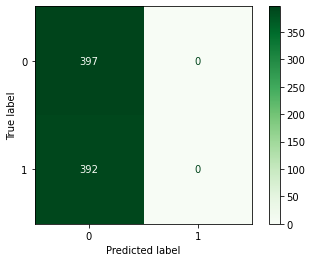

In [31]:
cm_display = ConfusionMatrixDisplay(mat_confusion).plot(cmap='Greens')

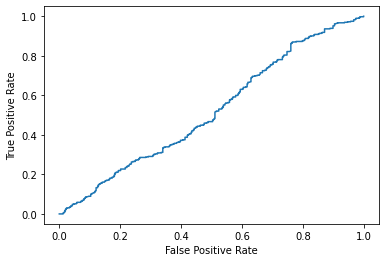

In [32]:

y_score = mejor_modelo.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=mejor_modelo.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

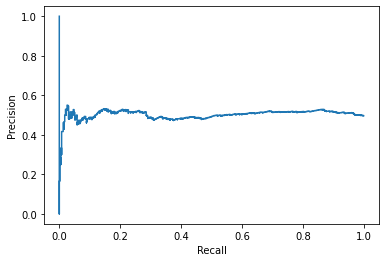

In [33]:
prec, recall, _ = precision_recall_curve(y_test, y_score, pos_label=mejor_modelo.classes_[1])
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot()

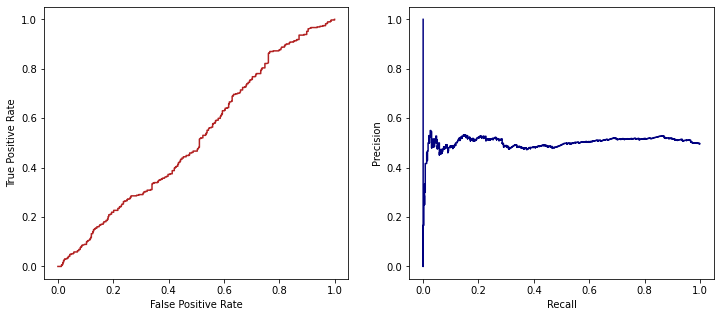

In [34]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

roc_display.plot(ax=ax1,color="firebrick")
pr_display.plot(ax=ax2,color="navy")
plt.show()

# Naive Bayes

In [35]:
clf = GaussianNB()
clf.fit(X_train, y_train)
clf.score(X_test,y_test)

0.6210392902408112

In [36]:
prob_pos_clf = clf.predict_proba(X_test)[:, 1]

In [37]:
clf_isotonic = CalibratedClassifierCV(clf, cv=5, method="isotonic")
clf_isotonic.fit(X_train, y_train)
prob_pos_isotonic = clf_isotonic.predict_proba(X_test)[:, 1]

In [38]:
clf_sigmoid = CalibratedClassifierCV(clf, cv=5, method="sigmoid")
clf_sigmoid.fit(X_train, y_train)
prob_pos_sigmoid = clf_sigmoid.predict_proba(X_test)[:, 1]

In [39]:
clf_score = brier_score_loss(y_test, prob_pos_clf)
print("No calibration: %1.3f" % clf_score)

clf_isotonic_score = brier_score_loss(y_test, prob_pos_isotonic)
print("With isotonic calibration: %1.3f" % clf_isotonic_score)

clf_sigmoid_score = brier_score_loss(y_test, prob_pos_sigmoid)
print("With sigmoid calibration: %1.3f" % clf_sigmoid_score)

No calibration: 0.327
With isotonic calibration: 0.234
With sigmoid calibration: 0.235


In [42]:
from matplotlib import cm
import numpy as np
plt.figure()
y_unique = np.unique(Y)
colors = cm.rainbow(np.linspace(0.0, 1.0, y_unique.size))


<Figure size 432x288 with 0 Axes>

In [43]:
y_test.to_numpy().shape

(789,)

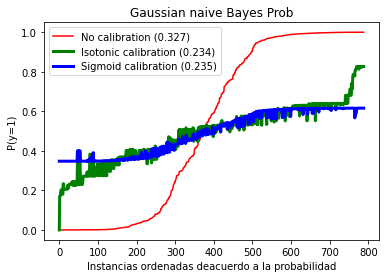

In [45]:
plt.figure()
order = np.lexsort((prob_pos_clf,))
plt.plot(prob_pos_clf[order], "r", label="No calibration (%1.3f)" % clf_score)
plt.plot(
    prob_pos_isotonic[order],
    "g",
    linewidth=3,
    label="Isotonic calibration (%1.3f)" % clf_isotonic_score,
)
plt.plot(
    prob_pos_sigmoid[order],
    "b",
    linewidth=3,
    label="Sigmoid calibration (%1.3f)" % clf_sigmoid_score,
)
#plt.plot(
#    np.linspace(0, y_test.size,num=y_test.size),
#    y_test.to_numpy()[order],
#    "k",
#    linewidth=3,
#    label=r"Empirical",
#)
plt.ylim([-0.05, 1.05])
plt.xlabel("Instancias ordenadas deacuerdo a la probabilidad")
plt.ylabel("P(y=1)")
plt.legend(loc="upper left")
plt.title("Gaussian naive Bayes Prob")

plt.show()

In [27]:
clf_isotonic.score(X_test,y_test),clf_sigmoid.score(X_test,y_test),clf.score(X_test,y_test)

(0.6400506970849176, 0.6121673003802282, 0.6210392902408112)

In [47]:
pred = clf_isotonic.predict(X = X_test)

In [48]:
mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = pred
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = pred,
            normalize = True
           )

print("Matriz de confusión")
print("-------------------")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

Matriz de confusión
-------------------
[[230 167]
 [117 275]]

El accuracy de test es: 64.00506970849176 %


In [49]:
print(classification_report(
        y_true = y_test,
        y_pred = pred
    ))

              precision    recall  f1-score   support

           0       0.66      0.58      0.62       397
           1       0.62      0.70      0.66       392

    accuracy                           0.64       789
   macro avg       0.64      0.64      0.64       789
weighted avg       0.64      0.64      0.64       789



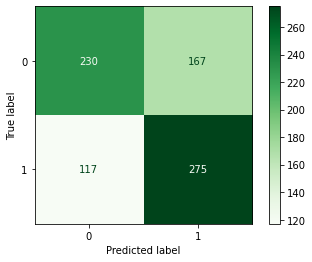

In [50]:
cm_display = ConfusionMatrixDisplay(mat_confusion).plot(cmap='Greens')

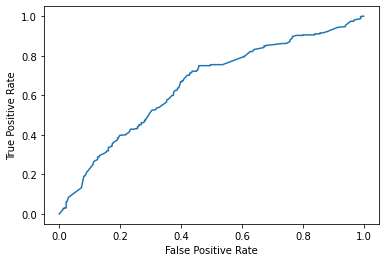

In [53]:
y_score = clf_isotonic.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=mejor_modelo.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

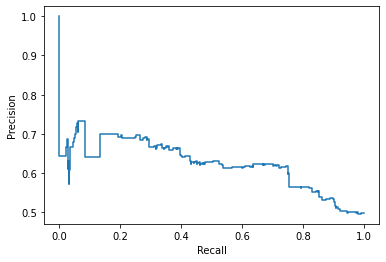

In [54]:
prec, recall, _ = precision_recall_curve(y_test, y_score, pos_label=mejor_modelo.classes_[1])
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot()

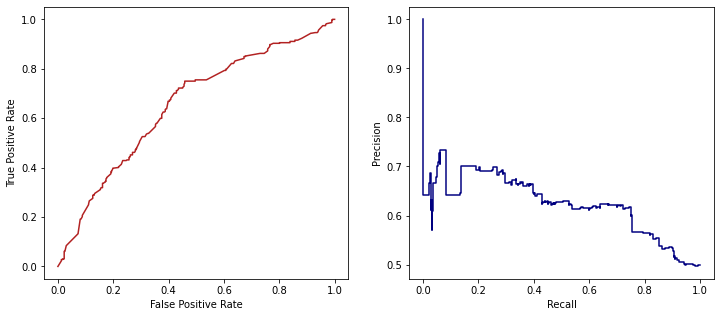

In [55]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

roc_display.plot(ax=ax1,color="firebrick")
pr_display.plot(ax=ax2,color="navy")
plt.show()

# SVM

In [36]:
distributions = dict(C=loguniform(1e-1, 1e2),
                     kernel = ['linear', 'poly', 'rbf', 'sigmoid'],
                     gamma = loguniform(1e-4, 1e+1),
                     degree = list(range(1,9)),
                     )
clf = RandomizedSearchCV(SVC(max_iter=5000,tol=1e-3), distributions, random_state=0,n_jobs=4,cv=5,verbose=1,n_iter=20)
search = clf.fit(X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    6.5s finished


In [38]:
pd.DataFrame(search.cv_results_).sort_values(by='rank_test_score')

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,param_gamma,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
3,0.182904,0.038830,0.047961,0.035154,1.413594,7,1.150386,rbf,"{'C': 1.4135935551752297, 'degree': 7, 'gamma'...",0.695652,0.714674,0.717391,0.701087,0.722071,0.710175,0.010073,1
14,0.285803,0.029992,0.044636,0.005254,12.384931,2,7.063913,rbf,"{'C': 12.384930898256398, 'degree': 2, 'gamma'...",0.676630,0.706522,0.703804,0.703804,0.722071,0.702566,0.014641,2
1,0.175846,0.009926,0.039581,0.006440,4.31171,2,0.131165,rbf,"{'C': 4.311710058685491, 'degree': 2, 'gamma':...",0.663043,0.668478,0.687500,0.682065,0.716621,0.683542,0.018757,3
19,0.292217,0.015311,0.059978,0.013361,0.575274,8,0.023631,rbf,"{'C': 0.5752740814116686, 'degree': 8, 'gamma'...",0.551630,0.619565,0.616848,0.622283,0.673025,0.616670,0.038590,4
16,0.290140,0.017817,0.058065,0.006463,0.88366,6,0.004219,rbf,"{'C': 0.8836597074694356, 'degree': 6, 'gamma'...",0.532609,0.603261,0.557065,0.551630,0.623978,0.573709,0.034217,5
11,0.289766,0.018367,0.041138,0.004087,5.073432,1,0.004175,poly,"{'C': 5.073432032394333, 'degree': 1, 'gamma':...",0.538043,0.548913,0.551630,0.565217,0.583106,0.557382,0.015504,6
8,0.212667,0.010152,0.034482,0.013436,0.226372,1,0.081302,poly,"{'C': 0.22637229697395475, 'degree': 1, 'gamma...",0.524457,0.605978,0.529891,0.614130,0.474114,0.549714,0.053031,7
12,0.167662,0.016989,0.015209,0.002491,6.859416,5,0.008559,linear,"{'C': 6.859416411328697, 'degree': 5, 'gamma':...",0.554348,0.486413,0.508152,0.567935,0.498638,0.523097,0.032107,8
10,0.215079,0.057110,0.019890,0.005992,0.621823,4,0.483716,linear,"{'C': 0.621823078201685, 'degree': 4, 'gamma':...",0.519022,0.510870,0.505435,0.527174,0.534060,0.519312,0.010424,9
15,0.154091,0.007725,0.014787,0.008297,10.278118,7,0.006177,linear,"{'C': 10.278118224157007, 'degree': 7, 'gamma'...",0.567935,0.483696,0.472826,0.513587,0.539510,0.515511,0.035106,10


In [39]:
pred = search.predict(X = X_test)

In [40]:
mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = pred
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = pred,
            normalize = True
           )

print("Matriz de confusión")
print("-------------------")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

Matriz de confusión
-------------------
[[254 143]
 [ 45 347]]

El accuracy de test es: 76.1723700887199 %


In [64]:
print(classification_report(
        y_true = y_test,
        y_pred = pred
    ))

              precision    recall  f1-score   support

           0       0.85      0.64      0.73       397
           1       0.71      0.89      0.79       392

    accuracy                           0.76       789
   macro avg       0.78      0.76      0.76       789
weighted avg       0.78      0.76      0.76       789



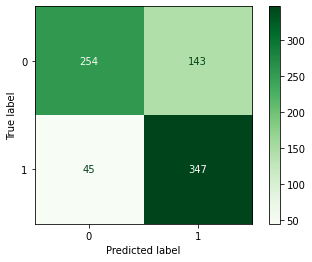

In [51]:

cm_display = ConfusionMatrixDisplay(mat_confusion).plot(cmap='Greens')

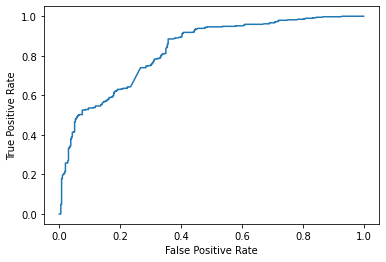

In [57]:
y_score = search.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=clf.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

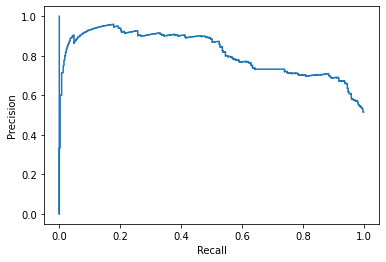

In [59]:
prec, recall, _ = precision_recall_curve(y_test, y_score, pos_label=clf.classes_[1])
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot()

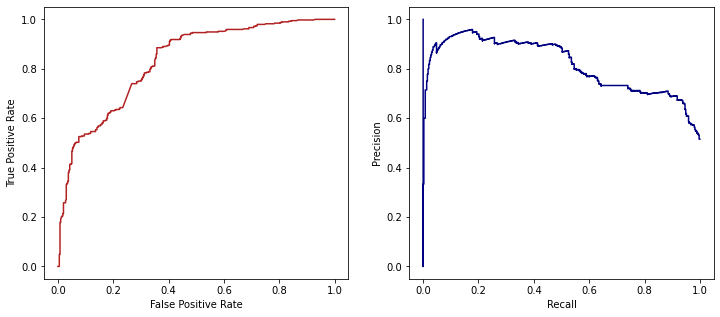

In [62]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

roc_display.plot(ax=ax1,color="firebrick")
pr_display.plot(ax=ax2,color="navy")
plt.show()

# Testing with Bayesian inference

In [61]:
opt = BayesSearchCV(
    SVC(max_iter=5000,tol=1e-3),
    {
        'C': Real(1e-1, 1e+1, prior='log-uniform'),
        'gamma': Real(1e-1, 1e+1, prior='log-uniform'),
        'degree': Integer(1, 8),  
        'kernel': Categorical(['linear', 'poly', 'rbf']),  
    },
    n_iter=50,
    cv=5,
    n_jobs=2
    
)
opt.total_iterations

200

In [62]:

opt.fit(X_train, y_train)

print("val. score: %s" % opt.best_score_)
print("test score: %s" % opt.score(X_test, y_test))

val. score: 0.7118084350195474
test score: 0.7566539923954373


/var/folders/x4/drtj4z6n66x0nmlgb4gsqrlh0000gn/T/ipykernel_71957/553134191.py:4: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


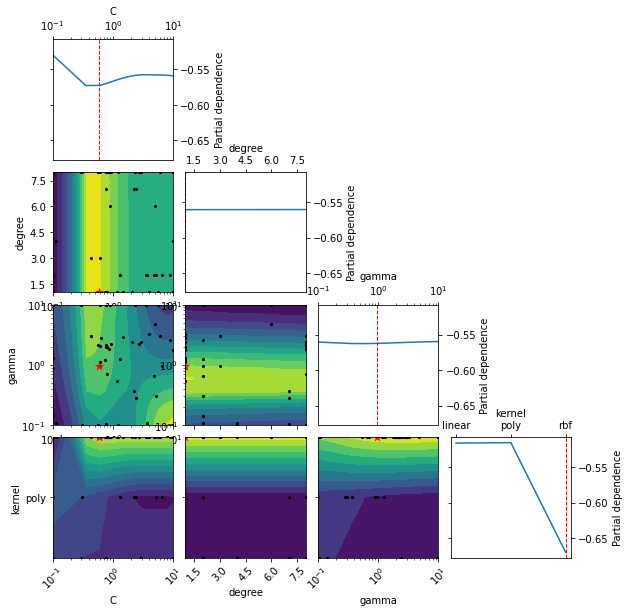

In [63]:
_ = plot_objective(opt.optimizer_results_[0],
                   dimensions=["C", "degree", "gamma", "kernel"],
                   n_minimum_search=int(1e8))
plt.show()

In [67]:
opt.optimizer_results_[0]

          fun: -0.7118084350195474
    func_vals: array([-0.51061338, -0.70419678, -0.50244491, -0.49483177, -0.6982274 ,
       -0.53016675, -0.51060597, -0.69658512, -0.70963156, -0.50299135,
       -0.50299135, -0.50299135, -0.71017652, -0.50843798, -0.52907535,
       -0.54759211, -0.70093591, -0.70147939, -0.68191269, -0.66940825,
       -0.70147939, -0.70202286, -0.70147939, -0.69984895, -0.66668345,
       -0.70147939, -0.70419974, -0.70419974, -0.70474174, -0.7052867 ,
       -0.70365182, -0.52202938, -0.70310834, -0.52475862, -0.70310686,
       -0.70419974, -0.52312966, -0.70474174, -0.524729  , -0.70201694,
       -0.70474322, -0.70474174, -0.68082425, -0.70419826, -0.7020199 ,
       -0.70419678, -0.7031113 , -0.70908808, -0.70365478, -0.71180844])
       models: [GaussianProcessRegressor(kernel=1**2 * Matern(length_scale=[1, 1, 1, 1], nu=2.5) + WhiteKernel(noise_level=1),
                         n_restarts_optimizer=2, noise='gaussian',
                         normalize_

/var/folders/x4/drtj4z6n66x0nmlgb4gsqrlh0000gn/T/ipykernel_71957/673210055.py:2: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


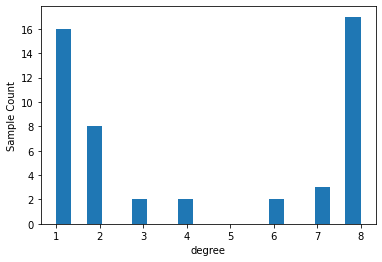

/Users/jamontanac/anaconda3/envs/proyecto/lib/python3.8/site-packages/sklearn/svm/_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
/Users/jamontanac/anaconda3/envs/proyecto/lib/python3.8/site-packages/sklearn/svm/_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
/Users/jamontanac/anaconda3/envs/proyecto/lib/python3.8/site-packages/sklearn/svm/_base.py:246: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'
/Users/jamontanac/anaconda3/envs/proyecto/lib/python3.8/site-packages/sklearn/svm/_base.py:246: ConvergenceWarning: Solver terminated early (m

In [68]:
_ = plot_histogram(opt.optimizer_results_[0], 1)
plt.show()

# Make the pipeline and choose the best model

In [71]:
from sklearn import preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.datasets import fetch_openml
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import make_column_selector

In [73]:
df=pd.read_csv('Base_campaña_DC.csv',encoding='iso-8859-1',sep=';')
df[' Patrimonio '] = df[' Patrimonio '].astype('str').str[:-3].astype('float')
df[' Ingresos_Mensuales '] = df[' Ingresos_Mensuales '].astype('str').str[:-3].astype('float')
df['oficina'] = df['oficina'].astype('str')
df['fecha_ult_desembolso'] = pd.to_datetime(df['fecha_ult_desembolso'],format='%d/%m/%Y')
df['tasa'] = df['tasa'].astype(str).str.replace(',','.').astype('float')
df['Acepta_Campaña']=df['Acepta_Campaña'].astype('category')
df['monto_credito']=df['monto_credito'].astype(float)
df['saldo_capital']=df['saldo_capital'].astype(float)
df['saldo_Ahorro']=df['saldo_Ahorro'].astype(float)

df.columns=[i.strip() for  i in df.columns]
y = df.columns[-1]
x=['Ciudad','Patrimonio','Ingresos_Mensuales',
 'No_hijos','monto_credito','tasa','saldo_capital',
 'saldo_Ahorro','Antiguedad_en_meses','Max_dias_mora','plazo_dias','Edad']
X = df[sorted(x)]
Y = df[y]
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')
preprocessor = ColumnTransformer(
    transformers=[
        ('categorical', categorical_transformer, make_column_selector(dtype_include=['object', 'category','bool'])),
        ('numeric',numeric_transformer,make_column_selector(dtype_include=['float64']))])

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state = 133)

mejor_modelo = RandomForestClassifier(
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123,
                n_estimators = 150,
                class_weight = 'balanced',
                max_features = 'sqrt',
                max_depth = 31,
                criterion = 'gini'
                
             )

clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', mejor_modelo)])

clf.fit(X_train,y_train)
print(clf.score(X_test,y_test))

0.8231939163498099


In [74]:
import pickle as pk
with open("Tree_model.pk","wb") as f:
    pk.dump(clf,f)

# Predict the new dataset

In [95]:
df_to_predict=pd.read_csv('Base_nueva_DC.csv',encoding='iso-8859-1',sep=';')

In [96]:
df_to_predict[' Patrimonio '] = df_to_predict[' Patrimonio '].astype('str').str[:-3].astype('float')
df_to_predict[' Ingresos_Mensuales '] = df_to_predict[' Ingresos_Mensuales '].astype('str').str[:-3].astype('float')
df_to_predict['oficina'] = df_to_predict['oficina'].astype('str')
df_to_predict['fecha_ult_desembolso'] = pd.to_datetime(df_to_predict['fecha_ult_desembolso'],format='%d/%m/%Y')
df_to_predict['tasa'] = df_to_predict['tasa'].astype(str).str.replace(',','.').astype('float')
df_to_predict['monto_credito']=df_to_predict['monto_credito'].astype(float)
df_to_predict['saldo_capital']=df_to_predict['saldo_capital'].astype(float)
df_to_predict['saldo_Ahorro']=df_to_predict['saldo_Ahorro'].astype(float)
df_to_predict.columns=[i.strip() for  i in df_to_predict.columns]
df_to_predict['Acepta_Campaña']=clf.predict(df_to_predict[sorted(x)])

In [265]:
x

['Ciudad',
 'Patrimonio',
 'Ingresos_Mensuales',
 'No_hijos',
 'monto_credito',
 'tasa',
 'saldo_capital',
 'saldo_Ahorro',
 'Antiguedad_en_meses',
 'Max_dias_mora',
 'plazo_dias',
 'Edad']

In [100]:
df_to_predict["Proba"]=clf.predict_proba(df_to_predict[sorted(x)])[:,1]

In [101]:
df_to_predict

,Id_Cliente,Ciudad,Patrimonio,Ingresos_Mensuales,No_hijos,oficina,fecha_ult_desembolso,monto_credito,tasa,saldo_capital,saldo_Ahorro,Antiguedad_en_meses,Max_dias_mora,plazo_dias,Edad,Acepta_Campaña,Proba
0,427658,Cartagena,745968.0,1614094.0,0,4024,2017-12-30,1500000.0,33.930000,1357387.0,33438.0,12,0,900,65,1,0.806667
1,427659,Barranquilla,834415.0,920234.0,1,4011,2017-12-18,1500000.0,33.930000,392262.0,0.0,12,0,540,40,1,0.637270
2,427670,Barranquilla,1164858.0,1568317.0,1,7032,2018-02-17,1064170.0,0.295732,211724.0,0.0,12,0,540,36,1,0.823352
3,427671,Cali,1187587.0,796660.0,1,7032,2017-12-25,2338552.0,0.295732,828993.0,0.0,12,0,720,47,0,0.360000
4,427720,Cartagena,2840488.0,1474771.0,0,7025,2018-01-23,2385560.0,33.930000,1997956.0,0.0,12,0,720,56,1,0.573333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,428626,Cartagena,37964203.0,477534.0,1,4003,2017-11-29,9000000.0,33.930000,7810084.0,18603.0,120,0,1080,30,0,0.272645
1496,428844,Barranquilla,46168677.0,1516403.0,0,4003,2017-11-29,8900000.0,33.930000,7810084.0,18603.0,120,0,1080,44,0,0.485627
1497,428405,Bogotá,28739705.0,848160.0,1,4030,2017-12-15,9000000.0,33.930000,9000000.0,19713.0,120,0,720,41,1,0.878925
1498,428623,Cali,37858892.0,1041188.0,2,4030,2017-12-15,9000000.0,33.930000,9000000.0,19713.0,120,0,720,48,1,0.544461


In [103]:
conditions = [
    (df_to_predict['Proba'] <= 0.15),
    (df_to_predict['Proba'] > 0.15) & (df_to_predict['Proba'] <= 0.45),
    (df_to_predict['Proba'] > 0.45) & (df_to_predict['Proba'] <= 0.65),
    (df_to_predict['Proba'] > 0.65) & (df_to_predict['Proba'] <= 0.85),
    (df_to_predict['Proba'] > 0.85)
    ]
values = ['No Cliente', 'No tan interesado', 'Cliente indeciso', 'Potencial cliente','Covertidor seguro']
df_to_predict['Tipo Cliente'] = np.select(conditions, values)

In [108]:
df_to_predict.groupby("Tipo Cliente").count()["Id_Cliente"].to_frame()

,Id_Cliente
Tipo Cliente,
Cliente indeciso,387
Covertidor seguro,73
No Cliente,187
No tan interesado,613
Potencial cliente,240


# Minimizando el riesgo y el gasto

In [124]:
a=[values,[5200,2500,850]]

In [142]:
b=[]
tmp=[]
count=1
for i in itertools.product(*a):
    tmp.append(i)
    if count%3==0:
        b.append(tmp)
        tmp=[]
    count+=1
b

[[('No Cliente', 5200), ('No Cliente', 2500), ('No Cliente', 850)],
 [('No tan interesado', 5200),
  ('No tan interesado', 2500),
  ('No tan interesado', 850)],
 [('Cliente indeciso', 5200),
  ('Cliente indeciso', 2500),
  ('Cliente indeciso', 850)],
 [('Potencial cliente', 5200),
  ('Potencial cliente', 2500),
  ('Potencial cliente', 850)],
 [('Covertidor seguro', 5200),
  ('Covertidor seguro', 2500),
  ('Covertidor seguro', 850)]]

In [148]:
for j in i:
    print(j[0])
    print(j[1])

No Cliente
5200
No tan interesado
5200
Cliente indeciso
5200
Potencial cliente
5200
Covertidor seguro
5200


{'Cliente indeciso': 387,
 'Covertidor seguro': 73,
 'No Cliente': 187,
 'No tan interesado': 613,
 'Potencial cliente': 240}

In [221]:
count=0
best=np.inf
Rs=[]
Gs=[]
ies=[]
best_Gasto=np.inf
num_clientes=df_to_predict.groupby('Tipo Cliente').count()['Id_Cliente'].to_dict()
for i in itertools.product(*b):
    R=0
    Gasto=0
    for j in i:
        prob=df_to_predict[df_to_predict['Tipo Cliente']==j[0]]['Proba']
        Gasto+=num_clientes[j[0]]*j[1]
        R+=np.sum(np.log(1/prob)*j[1])
    Gs.append(Gasto)
    Rs.append(R)
    ies.append(i)
    if R<best and Gasto<best_Gasto:
        print(f"best R={R}, G={Gasto} with {i}")
        best=R
        best_Gasto=Gasto
        params=i
    count+=1


best R=8009167.09015513, G=7800000 with (('No Cliente', 5200), ('No tan interesado', 5200), ('Cliente indeciso', 5200), ('Potencial cliente', 5200), ('Covertidor seguro', 5200))
best R=7992044.811282713, G=7602900 with (('No Cliente', 5200), ('No tan interesado', 5200), ('Cliente indeciso', 5200), ('Potencial cliente', 5200), ('Covertidor seguro', 2500))
best R=7981581.1964162355, G=7482450 with (('No Cliente', 5200), ('No tan interesado', 5200), ('Cliente indeciso', 5200), ('Potencial cliente', 5200), ('Covertidor seguro', 850))
best R=7807621.943280657, G=7152000 with (('No Cliente', 5200), ('No tan interesado', 5200), ('Cliente indeciso', 5200), ('Potencial cliente', 2500), ('Covertidor seguro', 5200))
best R=7790499.66440824, G=6954900 with (('No Cliente', 5200), ('No tan interesado', 5200), ('Cliente indeciso', 5200), ('Potencial cliente', 2500), ('Covertidor seguro', 2500))
best R=7780036.049541762, G=6834450 with (('No Cliente', 5200), ('No tan interesado', 5200), ('Cliente inde

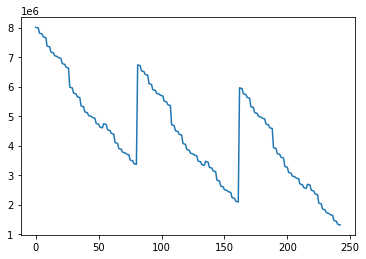

In [222]:
plt.plot(Rs)

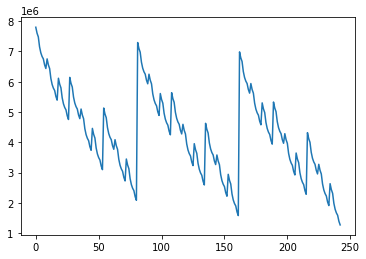

In [223]:
plt.plot(Gs)

In [224]:
count=0
to_explore=[]
for i in ies:
    if i[0][1]==850 & i[4][1]==850:
        to_explore.append(count)
    count+=1

In [225]:
np.log(np.array(Rs)[to_explore][-5:])

array([14.41536881, 14.34537031, 14.30648182, 14.17483207, 14.08491977])

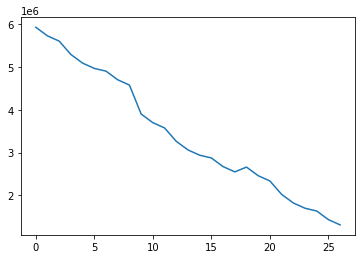

In [226]:
plt.plot(np.array(Rs)[to_explore])

In [227]:
np.array(ies)[to_explore][-5:]

array([[['No Cliente', '850'],
        ['No tan interesado', '850'],
        ['Cliente indeciso', '2500'],
        ['Potencial cliente', '2500'],
        ['Covertidor seguro', '850']],

       [['No Cliente', '850'],
        ['No tan interesado', '850'],
        ['Cliente indeciso', '2500'],
        ['Potencial cliente', '850'],
        ['Covertidor seguro', '850']],

       [['No Cliente', '850'],
        ['No tan interesado', '850'],
        ['Cliente indeciso', '850'],
        ['Potencial cliente', '5200'],
        ['Covertidor seguro', '850']],

       [['No Cliente', '850'],
        ['No tan interesado', '850'],
        ['Cliente indeciso', '850'],
        ['Potencial cliente', '2500'],
        ['Covertidor seguro', '850']],

       [['No Cliente', '850'],
        ['No tan interesado', '850'],
        ['Cliente indeciso', '850'],
        ['Potencial cliente', '850'],
        ['Covertidor seguro', '850']]], dtype='<U21')

In [228]:
strategy=[['No Cliente', '850'],
        ['No tan interesado', '850'],
        ['Cliente indeciso', '2500'],
        ['Potencial cliente', '2500'],
        ['Covertidor seguro', '850']]

In [236]:
for i in strategy:
    print(i[0]+","+str(i[1])+","+str(num_clientes[i[0]])+","+str(int(num_clientes[i[0]])*int(i[1])))

No Cliente,850,187,158950
No tan interesado,850,613,521050
Cliente indeciso,2500,387,967500
Potencial cliente,2500,240,600000
Covertidor seguro,850,73,62050


In [237]:
df_to_predict

,Id_Cliente,Ciudad,Patrimonio,Ingresos_Mensuales,No_hijos,oficina,fecha_ult_desembolso,monto_credito,tasa,saldo_capital,saldo_Ahorro,Antiguedad_en_meses,Max_dias_mora,plazo_dias,Edad,Acepta_Campaña,Proba,Tipo Cliente
0,427658,Cartagena,745968.0,1614094.0,0,4024,2017-12-30,1500000.0,33.930000,1357387.0,33438.0,12,0,900,65,1,0.806667,Potencial cliente
1,427659,Barranquilla,834415.0,920234.0,1,4011,2017-12-18,1500000.0,33.930000,392262.0,0.0,12,0,540,40,1,0.637270,Cliente indeciso
2,427670,Barranquilla,1164858.0,1568317.0,1,7032,2018-02-17,1064170.0,0.295732,211724.0,0.0,12,0,540,36,1,0.823352,Potencial cliente
3,427671,Cali,1187587.0,796660.0,1,7032,2017-12-25,2338552.0,0.295732,828993.0,0.0,12,0,720,47,0,0.360000,No tan interesado
4,427720,Cartagena,2840488.0,1474771.0,0,7025,2018-01-23,2385560.0,33.930000,1997956.0,0.0,12,0,720,56,1,0.573333,Cliente indeciso
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,428626,Cartagena,37964203.0,477534.0,1,4003,2017-11-29,9000000.0,33.930000,7810084.0,18603.0,120,0,1080,30,0,0.272645,No tan interesado
1496,428844,Barranquilla,46168677.0,1516403.0,0,4003,2017-11-29,8900000.0,33.930000,7810084.0,18603.0,120,0,1080,44,0,0.485627,Cliente indeciso
1497,428405,Bogotá,28739705.0,848160.0,1,4030,2017-12-15,9000000.0,33.930000,9000000.0,19713.0,120,0,720,41,1,0.878925,Covertidor seguro
1498,428623,Cali,37858892.0,1041188.0,2,4030,2017-12-15,9000000.0,33.930000,9000000.0,19713.0,120,0,720,48,1,0.544461,Cliente indeciso


# Procentaje de ganancia sobre la inversion

In [254]:
ganancias=df["Acepta_Campaña"].astype(int).sum()*14_000
inversion=len(df)*5200

In [255]:
ganancias

18284000

In [256]:
inversion

13665600

In [246]:
ganancias/inversion*100

133.7958084533427

In [257]:
strategy=[['No Cliente', '0'],
        ['No tan interesado', '850'],
        ['Cliente indeciso', '2500'],
        ['Potencial cliente', '2500'],
        ['Covertidor seguro', '850']]

In [258]:
inversion=0
for i in strategy:
    inversion+=int(num_clientes[i[0]])*int(i[1])

In [259]:
inversion

2150600

In [260]:
ganancias=df_to_predict["Acepta_Campaña"].astype(int).sum()*14_000

In [261]:
ganancias/inversion * 100

386.6827861992002

In [262]:
ganancias

8316000

In [264]:
386.6827861992002/133.7958084533427 * 100

289.0096413850247